In [ ]:
import numpy as np
import pandas as pd

In [ ]:
#!unzip "/content/drive/My Drive/dog_classification/dog_dataa.crdownload" -d "/content/drive/My Drive/dog_classification/"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print(f"Hub version is {hub.__version__}")
print("GPU is available" if tf.config.list_physical_devices("GPU") else "GPU not available")

Hub version is 0.8.0
GPU is available


In [ ]:
#importing label file
labels_csv = pd.read_csv('/content/drive/My Drive/ROCK_VISION/labels.csv')
print(labels_csv.describe())
print(labels_csv.sample(5))

                                  id    class              name
count                            224      224               224
unique                           224        3                14
top     migmatite_gneiss_m_t_141.jpg  igneous  clayey_siltstone
freq                               1       96                16
                                  id        class                 name
69          granite_gneiss_it_70.jpg      igneous       granite_gneiss
165  porphyritic_granite_i_t_166.jpg      igneous  porphyritic_granite
113         mica_granite_i_t_114.jpg      igneous         mica_granite
133     migmatite_gneiss_m_t_134.jpg  metamorphic     migmatite_gneiss
222                shale_s_t_223.jpg  sedimentary                shale


In [ ]:
labels_csv['name'].value_counts()

clayey_siltstone         16
granite_gneiss           16
pegmatite                16
marble                   16
limestone                16
quartzite                16
basalt                   16
migmatite_gneiss         16
porphyritic_granite      16
mica_granite             16
sandstone                16
shale                    16
ferrigenous_sandstone    16
chanockite               16
Name: name, dtype: int64

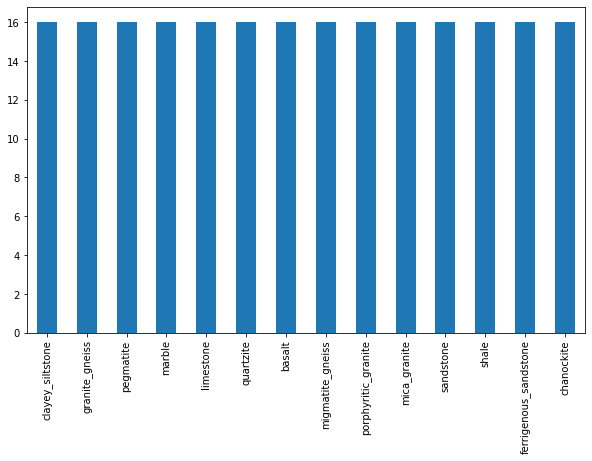

In [ ]:
labels_csv['name'].value_counts().plot.bar(figsize=(10,6))

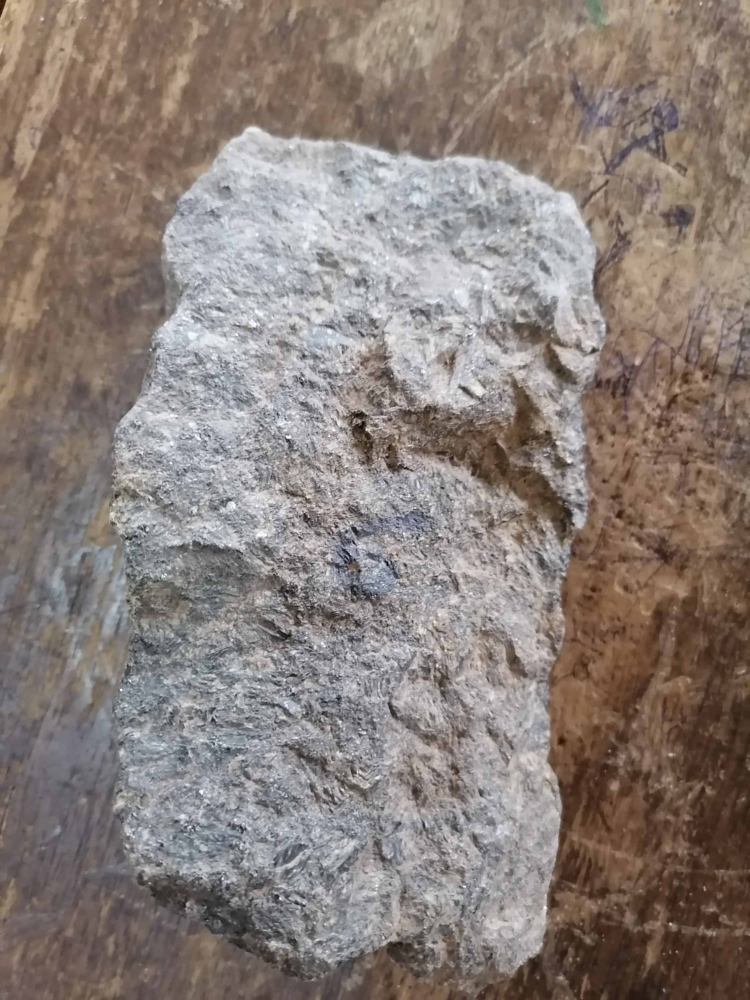

In [ ]:
from IPython.display import Image
Image('/content/drive/My Drive/ROCK_VISION/train/chanockite_i_t_22.jpg')

GETTING IMAGES AND FILE PATHS

In [ ]:
labels_csv.head()

,id,class,name
0,basalt_i_t_01.jpg,igneous,basalt
1,basalt_i_t_02.jpg,igneous,basalt
2,basalt_i_t_03.jpg,igneous,basalt
3,basalt_i_t_04.jpg,igneous,basalt
4,basalt_i_t_05.jpg,igneous,basalt


In [ ]:
filenames = [fname for fname in labels_csv['id']]
len(filenames)

224

In [ ]:
#filenames[:10]

In [ ]:
filepaths = ['/content/drive/My Drive/ROCK_VISION/train/'
+ fname for fname in labels_csv['id']]
print(filepaths[:10])

['/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_01.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_02.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_03.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_04.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_05.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_06.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_07.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_08.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_09.jpg', '/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_10.jpg']


In [ ]:
import os
if len(os.listdir('/content/drive/My Drive/ROCK_VISION/train/')) == len(filepaths):
  print("Files are complete")
else:
  print("Files are incomplete")

Files are complete


In [ ]:
labels = np.array(labels_csv['name'])
print(labels)

['basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt'
 'basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt' 'basalt'
 'chanockite' 'chanockite' 'chanockite' 'chanockite' 'chanockite'
 'chanockite' 'chanockite' 'chanockite' 'chanockite' 'chanockite'
 'chanockite' 'chanockite' 'chanockite' 'chanockite' 'chanockite'
 'chanockite' 'clayey_siltstone' 'clayey_siltstone' 'clayey_siltstone'
 'clayey_siltstone' 'clayey_siltstone' 'clayey_siltstone'
 'clayey_siltstone' 'clayey_siltstone' 'clayey_siltstone'
 'clayey_siltstone' 'clayey_siltstone' 'clayey_siltstone'
 'clayey_siltstone' 'clayey_siltstone' 'clayey_siltstone'
 'clayey_siltstone' 'ferrigenous_sandstone' 'ferrigenous_sandstone'
 'ferrigenous_sandstone' 'ferrigenous_sandstone' 'ferrigenous_sandstone'
 'ferrigenous_sandstone' 'ferrigenous_sandstone' 'ferrigenous_sandstone'
 'ferrigenous_sandstone' 'ferrigenous_sandstone' 'ferrigenous_sandstone'
 'ferrigenous_sandstone' 'ferrigenous_sandstone' 'ferrigenous_sand

In [ ]:
if len(os.listdir('/content/drive/My Drive/ROCK_VISION/train/')) == len(labels):
  print("Labels are complete")
else:
  print("Labels are incomplete")

Labels are complete


In [ ]:
#Find the number of unique labels
labels_unique = np.unique(labels)
labels_unique

array(['basalt', 'chanockite', 'clayey_siltstone',
       'ferrigenous_sandstone', 'granite_gneiss', 'limestone', 'marble',
       'mica_granite', 'migmatite_gneiss', 'pegmatite',
       'porphyritic_granite', 'quartzite', 'sandstone', 'shale'],
      dtype=object)

In [ ]:
len(labels_unique)

14

In [ ]:
#turning all labels into boolean values
boolean_labels = [label == labels_unique for label in labels]
print(boolean_labels)

[array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False]), array([ True, False, False, False, False, False, False, False, False,
       False, Fal

In [ ]:
len(boolean_labels)

224

In [ ]:
print(labels[20])
print(np.where(labels_unique == labels[20]))  #index where label occurs
print(boolean_labels[20].argmax())    # index where label occurs in boolean array
print(boolean_labels[20].astype(int))    #there should be a 1 where label occurs 

chanockite
(array([1]),)
1
[0 1 0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
#Creating our own validation set


In [ ]:
X = filepaths
y = boolean_labels

In [ ]:
y

[array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False]),
 array([ True, False, False, False, False, False, False, False, False,
 

In [ ]:
NUM_IMAGES = 225 #@param {type:"slider", min:10, max:225, step:15}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

In [ ]:
print(len(X_train))
print(len(X_val))
print(len(y_train))
print(len(y_val))

179
45
179
45


In [ ]:
print(X_train[:5])
print(y_train[:5])
print(X_val[:5])
print(y_val[:5])

['/content/drive/My Drive/ROCK_VISION/train/mica_granite_i_t_128.jpg', '/content/drive/My Drive/ROCK_VISION/train/granite_gneiss_it_67.jpg', '/content/drive/My Drive/ROCK_VISION/train/granite_gneiss_it_74.jpg', '/content/drive/My Drive/ROCK_VISION/train/marble_m_t_097.jpg', '/content/drive/My Drive/ROCK_VISION/train/mica_granite_i_t_120.jpg']
[array([False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False]), array([False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False]), array([False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False]), array([False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False]), array([False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False])]
['/content/drive/My Drive/ROCK_VISION/train/basalt_i_t_10.jpg', '/content/drive/My D

In [ ]:
labels_csv.head()

,id,class,name
0,basalt_i_t_01.jpg,igneous,basalt
1,basalt_i_t_02.jpg,igneous,basalt
2,basalt_i_t_03.jpg,igneous,basalt
3,basalt_i_t_04.jpg,igneous,basalt
4,basalt_i_t_05.jpg,igneous,basalt


In [ ]:
#Preprocessing images (turning images into Tensors)

In [ ]:
from matplotlib.pyplot import imread
image = imread(filepaths[42])
image.shape

(3136, 3136, 3)

In [ ]:
#turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 3136, 3), dtype=uint8, numpy=
array([[[ 13,   3,   2],
        [ 14,   6,   4],
        [ 13,   8,   5],
        ...,
        [108, 111, 104],
        [110, 115, 109],
        [108, 113, 107]],

       [[ 15,   5,   4],
        [ 16,   8,   6],
        [ 14,   9,   6],
        ...,
        [110, 113, 106],
        [108, 110, 105],
        [105, 110, 104]]], dtype=uint8)>

In [ ]:
img_size = 224

def process_image(image_path):
  '''Functtion to process images from the image path'''
  image1 = tf.io.read_file(image_path)

  #turn the image into numerical tensors with three colour channels (r, g, b)
  image1 = tf.image.decode_jpeg(image1, channels=3)

  #convert the image colour channels from 0-255 to 0-1
  image1 = tf.image.convert_image_dtype(image1, tf.float32)

  #resize the image
  image1 = tf.image.resize(image1, size=[img_size, img_size])

  return image1


In [ ]:
image2 = tf.io.read_file(filepaths[42])
image2 = tf.image.decode_jpeg(image2, channels=3)
image2 = tf.image.convert_image_dtype(image2, tf.float32)
print(image2)

tf.Tensor(
[[[0.04705883 0.01568628 0.00784314]
  [0.05490196 0.02352941 0.01568628]
  [0.04313726 0.02745098 0.01568628]
  ...
  [0.41176474 0.43137258 0.4039216 ]
  [0.427451   0.44705886 0.41960788]
  [0.41960788 0.43921572 0.41176474]]

 [[0.05490196 0.02352941 0.01176471]
  [0.05882353 0.02745098 0.01568628]
  [0.04705883 0.03529412 0.01568628]
  ...
  [0.41960788 0.43921572 0.41176474]
  [0.4156863  0.43529415 0.40784317]
  [0.40784317 0.427451   0.40000004]]

 [[0.06666667 0.03137255 0.01176471]
  [0.06666667 0.03137255 0.01176471]
  [0.05490196 0.03529412 0.01960784]
  ...
  [0.43137258 0.45098042 0.42352945]
  [0.41960788 0.43921572 0.4156863 ]
  [0.42352945 0.4431373  0.41960788]]

 ...

 [[0.04705883 0.02745098 0.04313726]
  [0.04705883 0.02745098 0.04313726]
  [0.03529412 0.02745098 0.03921569]
  ...
  [0.21176472 0.20000002 0.18039216]
  [0.20784315 0.19607845 0.1764706 ]
  [0.20392159 0.19215688 0.17254902]]

 [[0.03921569 0.03137255 0.03529412]
  [0.03529412 0.02745098 0

In [ ]:
#turning our images into batches

def get_image_label(image_path, label):
  '''Takes an image filepath and the corresponding label and 
  process the iage and return a tuple of tensors and label'''

  image = process_image(image_path)

  return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.03137255, 0.02745098, 0.01176471],
         [0.06666667, 0.02745098, 0.02745098],
         [0.08235294, 0.02941177, 0.01176471],
         ...,
         [0.43235296, 0.46176475, 0.4303922 ],
         [0.42156866, 0.4294118 , 0.4176471 ],
         [0.45000005, 0.47745103, 0.45000005]],
 
        [[0.07352941, 0.04607844, 0.02254902],
         [0.06078432, 0.04117647, 0.01764706],
         [0.07843138, 0.03529412, 0.02745098],
         ...,
         [0.33529413, 0.35882354, 0.33333334],
         [0.3480392 , 0.37549022, 0.3480392 ],
         [0.3647059 , 0.38627452, 0.36666667]],
 
        [[0.09607844, 0.04509804, 0.02156863],
         [0.08431373, 0.05686275, 0.03333334],
         [0.07745098, 0.05588236, 0.02254902],
         ...,
         [0.20588237, 0.20784315, 0.21568629],
         [0.20980394, 0.20980394, 0.23137257],
         [0.20098041, 0.22156864, 0.23137257]],
 
        ...,
 
        [[0.03921569, 0.02941177

Definitng a function to convert our data into batches of 32

In [ ]:
BATCH_SIZE = 32

#Creating the function
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, test_data=False, valid_data=False):
  '''
  Creates batches of data out of image (X) and label (y)
  Shuffles the data if it is trainingbut doesn't shuffle if it is validation data.
  And also accept test data as input (no labels)
  '''

  if test_data:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))  #only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)

    return data_batch

  #if the data is a validation data, we don't need to shuffle it
  if valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batches = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batches

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
    #shuffling filepaths and labels before mapping image processor is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batches = data.batch(BATCH_SIZE)

    return data_batches

In [ ]:
#Creating training and validation data batches

train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
#Checking out the attributes of our data batches
print(train_data.element_spec)
print(valid_data.element_spec)

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 14), dtype=tf.bool, name=None))
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 14), dtype=tf.bool, name=None))


In [ ]:
#Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch
  '''
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(labels_unique[labels[i].argmax()])


In [ ]:
labels_unique[y[45].argmax()]

'clayey_siltstone'

In [ ]:
#unbatching train data
train_images, train_labels = next(train_data.as_numpy_iterator())
#train_images, train_labels

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 14)), types: (tf.float32, tf.bool)>

In [ ]:
len(train_images), len(train_labels)

(32, 32)

In [ ]:
train_labels

array([[False, False, False, False, False, False, False,  True, False,
        False, False, False, False, False],
       [False, False, False, False, False,  True, False, False, False,
        False, False, False, False, False],
       [False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True],
       [False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False],
       [False, False, False, False, False, False, False, False, False,
        False, False,  True, False, False],
       [False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False],
       [False, False, False, False, False, False, False, False, False,
        False, False, False,  True, False],
       [False, False, False, False, False, False, False, False,  True,
        F

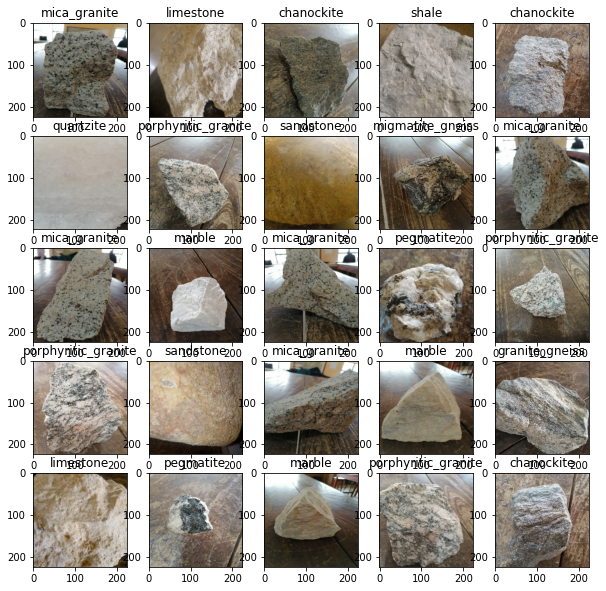

In [ ]:
#Visualizing the data in a train batch

show_25_images(train_images, train_labels)

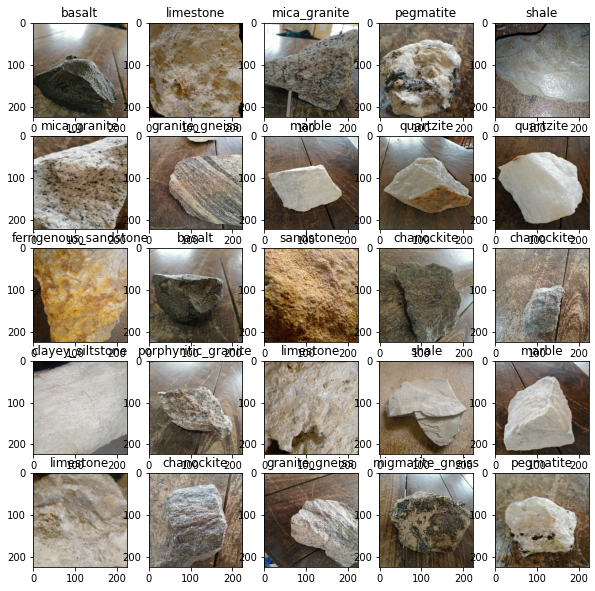

In [ ]:
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

In [ ]:
#Building a model using transfer learning

In [ ]:
#setup input and shape to our model
INPUT_SHAPE = [None, img_size, img_size, 3] #batch, height, width, colour
OUTPUT_SHAPE = len(labels_unique)

#setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'


The steps to the codes below can be found from this link https://www.tensorflow.org/tutorials/keras/classification

224

In [ ]:
#Putting the input, output and model into a keras deep learning model!

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f'Building model with {MODEL_URL}')

  #setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), #Layer 1 (Input layer)
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                               activation='softmax') #Layer 2 (Output layer)
                               ])
  
  #compiling the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
                )
  
  #build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     multiple                  5432713   
_________________________________________________________________
dense (Dense)                multiple                  14028     
Total params: 5,446,741
Trainable params: 14,028
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
#creating callbacks

Creating TensorBoard Callback

In [ ]:
#Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create function to build TensorBoard callback
def create_tensorboard_callback():
  #create a log directory fo storing TensorBoard logs
  logdir = os.path.join('drive/My Drive/ROCK_VISION/logs', 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

Creating an Early Stopping Callback

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=5)

Training our model (on a subset of data)


In [ ]:
NUM_EPOCHS = 30 #@param {type:"slider", min:10, max:100, step:10}
print("GPU", "is available" if tf.config.list_physical_devices("GPU") else "not available") 

GPU is available


Creating a function which runs the model

In [ ]:
def train_model():
  '''
  Trains a given model and returns the tarined version
  '''
  #create model
  model = create_model()

  #Createnew TensorBoard session anytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the data to the model passing it to the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
#Fit the model to the data
model = train_model()

Building model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/30
6/6 [==============================] - 144s 24s/step - loss: 3.7144 - accuracy: 0.1173 - val_loss: 2.5618 - val_accuracy: 0.1778
Epoch 2/30
6/6 [==============================] - 22s 4s/step - loss: 1.7537 - accuracy: 0.4190 - val_loss: 1.4100 - val_accuracy: 0.5333
Epoch 3/30
6/6 [==============================] - 22s 4s/step - loss: 0.8096 - accuracy: 0.7374 - val_loss: 0.7929 - val_accuracy: 0.7778
Epoch 4/30
6/6 [==============================] - 22s 4s/step - loss: 0.1999 - accuracy: 0.9888 - val_loss: 0.3904 - val_accuracy: 0.9111
Epoch 6/30
6/6 [==============================] - 22s 4s/step - loss: 0.1245 - accuracy: 0.9944 - val_loss: 0.3357 - val_accuracy: 0.9111
Epoch 7/30
6/6 [==============================] - 21s 4s/step - loss: 0.0821 - accuracy: 0.9944 - val_loss: 0.3059 - val_accuracy: 0.9333
Epoch 8/30
6/6 [==============================] - 22s 4s/step - loss: 0.0592 -

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.bool)>

In [ ]:
%tensorboard --logdir drive/My\ Drive/dog_classification/logs

<IPython.core.display.Javascript object>

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

2/2 [==============================] - 2s 768ms/step


array([[9.86708760e-01, 3.14370001e-04, 2.24119613e-05, 1.25986713e-04,
        3.54624121e-03, 1.02586346e-05, 1.53306359e-03, 5.10309881e-04,
        2.64251884e-03, 3.14822141e-03, 6.39090606e-04, 2.70355988e-04,
        2.35423751e-04, 2.92910787e-04],
       [6.81050665e-07, 2.73675523e-05, 4.54762230e-05, 8.54995014e-05,
        1.14393897e-05, 9.99641180e-01, 8.25855295e-06, 6.04903971e-06,
        1.72714397e-06, 7.24190704e-06, 4.71914927e-06, 1.14382834e-04,
        4.39842261e-05, 2.05499123e-06],
       [2.80385320e-05, 1.51681001e-04, 5.24993520e-05, 1.74737361e-04,
        4.99469461e-03, 9.45468782e-05, 8.09906414e-05, 9.93037641e-01,
        1.70739717e-04, 1.13265924e-05, 8.42162583e-04, 1.42459874e-04,
        1.46357488e-04, 7.20804019e-05],
       [1.05327723e-04, 1.01997888e-04, 1.05596509e-05, 1.36733323e-03,
        4.75562236e-04, 2.92735845e-02, 1.52425882e-05, 1.46551314e-03,
        5.48830440e-06, 9.49924767e-01, 1.69271100e-02, 5.42637936e-05,
        1.656

In [ ]:
predictions.shape

(45, 14)

In [ ]:
index = 8

print(predictions[index])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {labels_unique[np.argmax(predictions[index])]}')

[2.9807899e-04 3.1773932e-05 5.7768309e-04 4.8787933e-05 2.7460034e-04
 9.1549038e-05 3.0066750e-03 1.8694426e-04 6.4291427e-04 2.9649754e-04
 8.8866387e-04 9.9344182e-01 1.1630820e-05 2.0233339e-04]
Max value (probability of predictions): 0.9934418201446533
Sum: 0.9999999403953552
Max index: 11
Predicted Label: quartzite


In [ ]:
predictions[5]

array([3.3067568e-04, 5.7031583e-02, 1.6371738e-02, 1.9192903e-03,
       1.5718147e-02, 4.8850274e-01, 2.1395685e-04, 1.4116175e-01,
       2.9234355e-04, 1.2772943e-01, 1.4951961e-01, 4.7977408e-04,
       4.9922970e-04, 2.2976231e-04], dtype=float32)

In [ ]:
labels_unique[np.argmax(predictions[index])]

'quartzite'

In [ ]:
def get_pred_label(probabilities, index):
    '''
    Function to get the shoe label
    '''
    
    return labels_unique[np.argmax(probabilities[index])]

In [ ]:
get_pred_label(predictions, 13)

'chanockite'

In [ ]:
for i in range(14):
    print(get_pred_label(predictions, i))

basalt
limestone
mica_granite
pegmatite
clayey_siltstone
limestone
chanockite
marble
quartzite
quartzite
ferrigenous_sandstone
basalt
sandstone
chanockite


In [ ]:
images_ = []
labels_ = []

for image, label in valid_data.unbatch().as_numpy_iterator():
    images_.append(image), labels_.append(label)
    
print(len(images_), len(labels_))

45 45


In [ ]:
def unbatchify(data):
    
    '''
    Function to unbatchify batchified data
    '''
    images = []
    labels = []
    
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image), labels.append(label)
        
    return images, labels

In [ ]:
images, labels = unbatchify(valid_data)

In [ ]:
def get_pred(probabilities, labels, images, n):
    
    '''
    View the prediction, ground truth, and image for sample n
    '''
    
    pred_prob, true_label, image = probabilities, labels_unique[labels[n].argmax()], images[n]
    
    pred_label = get_pred_label(pred_prob, n)
    
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    
    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'
    
    plt.title("{} {:.2f}% {}".format(pred_label,
                                   pred_prob[n].max()*100,
                                   true_label), color=color)

In [ ]:
predictions[15].max()

0.99864286

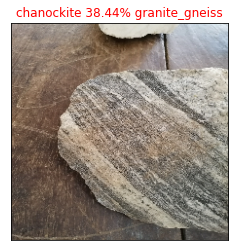

In [ ]:
get_pred(predictions, valid_labels, valid_images, 6)

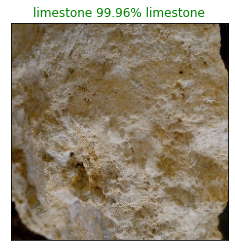

In [ ]:
get_pred(predictions, valid_labels, valid_images, 1)

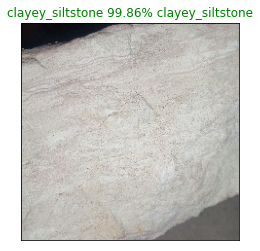

In [ ]:
get_pred(predictions, valid_labels, valid_images, 15)

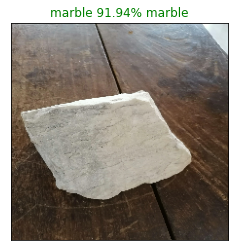

In [ ]:
get_pred(predictions, valid_labels, valid_images, 7)

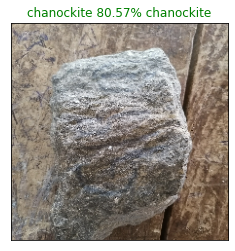

In [ ]:
get_pred(predictions, valid_labels, valid_images, 21)

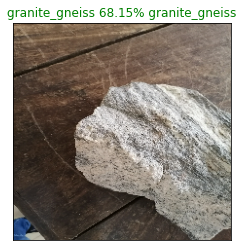

In [ ]:
get_pred(predictions, valid_labels, valid_images, 22)

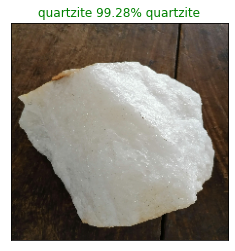

In [ ]:
get_pred(predictions, valid_labels, valid_images, 9)

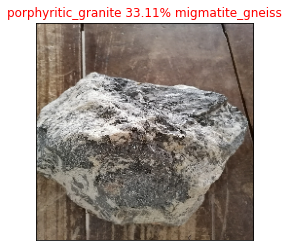

In [ ]:
get_pred(predictions, valid_labels, valid_images, 25)

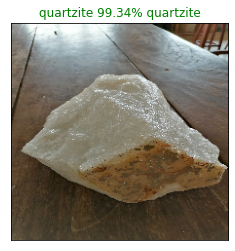

In [ ]:
get_pred(predictions, valid_labels, valid_images, 8)

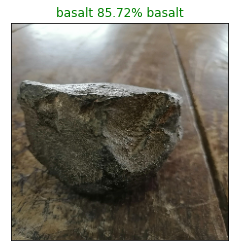

In [ ]:
get_pred(predictions, valid_labels, valid_images, 11)

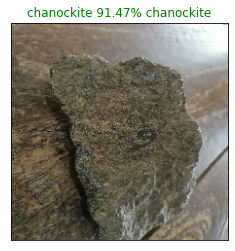

In [ ]:
get_pred(predictions, valid_labels, valid_images, 13)

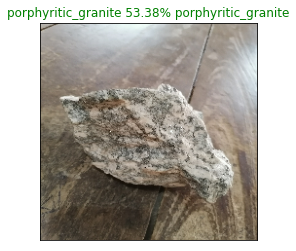

In [ ]:
get_pred(predictions, valid_labels, valid_images, 16)

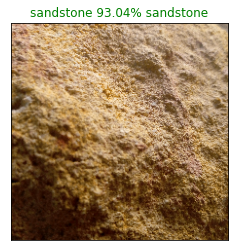

In [ ]:
get_pred(predictions, valid_labels, valid_images, 12)

In [ ]:
def plot_pred_conf(pred_probabilities, labels, n):

    pred_prob, true_label = pred_probabilities, labels_unique[labels[n].argmax()]
    
    pred_label = get_pred_label(pred_prob, n)
    
    top_10_pred_indexes = pred_prob[n].argsort()[-14:][::-1]
    # FInd the top 10 prediction confidence values
    
    top_10_pred_values = pred_prob[n][top_10_pred_indexes]
    
    top_10_pred_labels = labels_unique[top_10_pred_indexes]
    
    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')
    
    #Change the colour of the true label
    if np.isin(true_label, top_10_pred_labels):
    #if true_label in top_10_pred_labels:
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

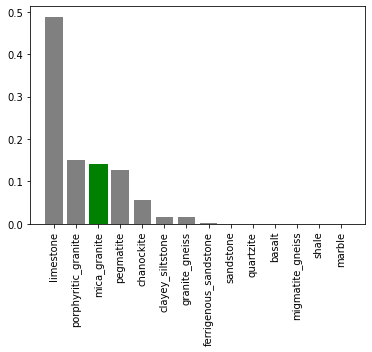

In [ ]:
plot_pred_conf(predictions, valid_labels, n=5)

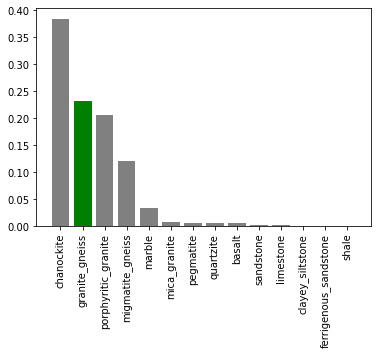

In [ ]:
plot_pred_conf(predictions, valid_labels, n=6)

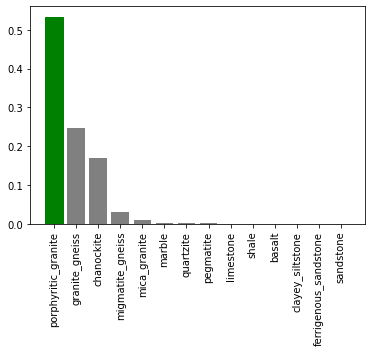

In [ ]:
plot_pred_conf(predictions, valid_labels, n=16)

In [ ]:
valid_labels.shape, valid_images.shape

((32, 14), (32, 224, 224, 3))

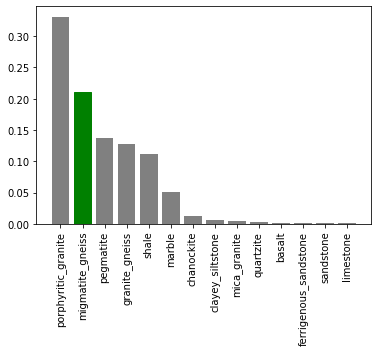

In [ ]:
plot_pred_conf(predictions, valid_labels, n=25)